In [14]:
# Import necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [15]:
# Load the dataset
df = pd.read_csv('./full_merged.csv')
df.head()

,measure_datetime,water_level,temperature_2m,rain,showers,cloud_cover,relative_humidity_2m,dew_point_2m,precipitation,weather_code,pressure_msl,surface_pressure,wind_speed_10m,wind_direction_10m,wind_gusts_10m,et0_fao_evapotranspiration,river_discharge
0,2019-01-01 00:00:00,0.621667,23.5,0.0,0.0,2,65,16.6,0.0,0,1017.1,1017.0,6.9,43,11.2,0.03,1131.400000
1,2019-01-01 01:00:00,0.723333,22.7,0.0,0.0,1,68,16.4,0.0,0,1016.7,1016.6,6.6,22,10.8,0.02,1131.727083
2,2019-01-01 02:00:00,0.713333,22.0,0.0,0.0,2,75,17.3,0.0,0,1016.5,1016.4,6.0,25,10.4,0.01,1132.054167
3,2019-01-01 03:00:00,0.695000,21.4,0.0,0.0,2,80,17.8,0.0,0,1016.1,1016.0,5.3,28,9.4,0.00,1132.381250
4,2019-01-01 04:00:00,0.633333,20.7,0.0,0.0,1,86,18.3,0.0,0,1015.8,1015.7,7.2,18,8.6,0.00,1132.708333


In [16]:
# Set the datetime index
df['date'] = pd.to_datetime(df['measure_datetime'])
df.drop(columns=['measure_datetime'], inplace=True)
df.set_index('date', inplace=True)
df.sort_index(inplace=True)
df.head()

,water_level,temperature_2m,rain,showers,cloud_cover,relative_humidity_2m,dew_point_2m,precipitation,weather_code,pressure_msl,surface_pressure,wind_speed_10m,wind_direction_10m,wind_gusts_10m,et0_fao_evapotranspiration,river_discharge
date,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,0.621667,23.5,0.0,0.0,2,65,16.6,0.0,0,1017.1,1017.0,6.9,43,11.2,0.03,1131.400000
2019-01-01 01:00:00,0.723333,22.7,0.0,0.0,1,68,16.4,0.0,0,1016.7,1016.6,6.6,22,10.8,0.02,1131.727083
2019-01-01 02:00:00,0.713333,22.0,0.0,0.0,2,75,17.3,0.0,0,1016.5,1016.4,6.0,25,10.4,0.01,1132.054167
2019-01-01 03:00:00,0.695000,21.4,0.0,0.0,2,80,17.8,0.0,0,1016.1,1016.0,5.3,28,9.4,0.00,1132.381250
2019-01-01 04:00:00,0.633333,20.7,0.0,0.0,1,86,18.3,0.0,0,1015.8,1015.7,7.2,18,8.6,0.00,1132.708333


In [17]:
# Display dataset information
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 56232 entries, 2019-01-01 00:00:00 to 2025-05-31 23:00:00
Data columns (total 16 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   water_level                 56232 non-null  float64
 1   temperature_2m              56232 non-null  float64
 2   rain                        56232 non-null  float64
 3   showers                     56232 non-null  float64
 4   cloud_cover                 56232 non-null  int64  
 5   relative_humidity_2m        56232 non-null  int64  
 6   dew_point_2m                56232 non-null  float64
 7   precipitation               56232 non-null  float64
 8   weather_code                56232 non-null  int64  
 9   pressure_msl                56232 non-null  float64
 10  surface_pressure            56232 non-null  float64
 11  wind_speed_10m              56232 non-null  float64
 12  wind_direction_10m          56232 non-null  int64  
 

In [18]:
# Describe the dataset
df.describe()

,water_level,temperature_2m,rain,showers,cloud_cover,relative_humidity_2m,dew_point_2m,precipitation,weather_code,pressure_msl,surface_pressure,wind_speed_10m,wind_direction_10m,wind_gusts_10m,et0_fao_evapotranspiration,river_discharge
count,56232.000000,56232.000000,56232.000000,56232.0,56232.000000,56232.000000,56232.000000,56232.000000,56232.000000,56232.000000,56232.000000,56232.000000,56232.000000,56232.000000,56232.000000,56232.000000
mean,0.390225,28.193141,0.179494,0.0,69.235524,74.350494,22.830203,0.179494,12.820102,1009.349577,1009.249577,9.426142,180.359386,20.077043,0.183186,1223.418451
std,0.690438,2.980016,0.797400,0.0,36.774707,14.614136,3.056060,0.797400,21.162602,3.050357,3.050357,4.546150,91.862950,9.288079,0.219675,1467.445569
min,-9.376667,15.400000,0.000000,0.0,0.000000,17.000000,5.700000,0.000000,0.000000,999.200000,999.100000,0.000000,1.000000,0.700000,0.000000,0.000000
25%,-0.086667,26.300000,0.000000,0.0,35.000000,65.000000,22.000000,0.000000,1.000000,1007.200000,1007.100000,5.900000,116.000000,12.600000,0.010000,0.181979
50%,0.508333,28.100000,0.000000,0.0,91.000000,77.000000,23.900000,0.000000,3.000000,1009.200000,1009.100000,8.800000,188.000000,19.100000,0.060000,817.475417
75%,0.901667,30.200000,0.000000,0.0,100.000000,86.000000,24.800000,0.000000,3.000000,1011.400000,1011.300000,12.400000,238.000000,26.300000,0.340000,1718.802500
max,4.853333,38.700000,22.100000,0.0,100.000000,100.000000,28.100000,22.100000,65.000000,1020.700000,1020.600000,29.300000,360.000000,63.400000,0.850000,7463.490000


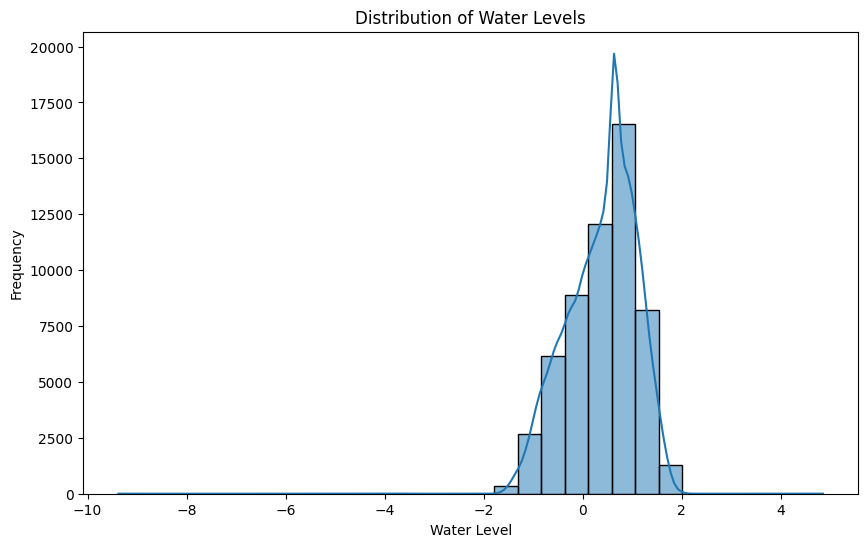

In [19]:
# Distribution of water levels
plt.figure(figsize=(10, 6))
sns.histplot(df['water_level'], bins=30, kde=True)
plt.title('Distribution of Water Levels')
plt.xlabel('Water Level')
plt.ylabel('Frequency')
plt.show()

Daily data loaded: (2343, 18)
Columns: ['water_level', 'temperature_2m', 'rain', 'showers', 'cloud_cover', 'relative_humidity_2m', 'dew_point_2m', 'precipitation', 'weather_code', 'pressure_msl', 'surface_pressure', 'wind_speed_10m', 'wind_direction_10m', 'wind_gusts_10m', 'et0_fao_evapotranspiration', 'river_discharge', 'water_level_pct', 'risk_level']
✓ Risk assessment columns found in CSV!


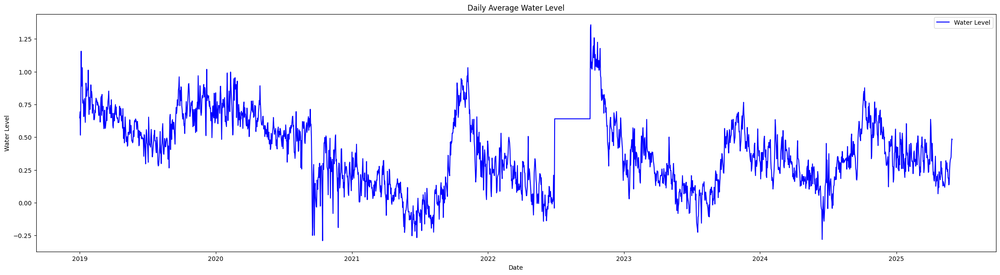

In [20]:
# Load daily data with risk assessment columns
# The daily CSV already includes water_level_pct and risk_level columns
df_daily = pd.read_csv('./full_merged_daily.csv')
df_daily['measure_datetime'] = pd.to_datetime(df_daily['measure_datetime'])
df_daily.set_index('measure_datetime', inplace=True)
df_daily.sort_index(inplace=True)

print(f"Daily data loaded: {df_daily.shape}")
print(f"Columns: {df_daily.columns.tolist()}")

# Verify risk assessment columns exist
if 'water_level_pct' not in df_daily.columns or 'risk_level' not in df_daily.columns:
    print("\n⚠️ WARNING: Risk assessment columns NOT found in CSV!")
    print("Adding them now...")
    
    # Station parameters for CPY015 at Krungthep Bridge (m.MSL)
    BANK_LEVEL = 2.161  # Top of riverbank
    BED_LEVEL = -15.70  # River bed level
    TOTAL_CAPACITY = BANK_LEVEL - BED_LEVEL
    
    # Calculate water level percentage
    df_daily['water_level_pct'] = ((df_daily['water_level'] - BED_LEVEL) / TOTAL_CAPACITY) * 100
    
    # Determine risk level
    def determine_risk_level(water_level_pct):
        if water_level_pct >= 70:
            return 'High Risk'
        elif water_level_pct >= 30:
            return 'Medium Risk'
        else:
            return 'Low Risk'
    
    df_daily['risk_level'] = df_daily['water_level_pct'].apply(determine_risk_level)
    print("✓ Risk columns added successfully!")
    print(f"Updated shape: {df_daily.shape}")
else:
    print("✓ Risk assessment columns found in CSV!")

# Plot daily water level trends
plt.figure(figsize=(28, 7))
plt.plot(df_daily.index, df_daily['water_level'], label='Water Level', color='blue')
plt.title('Daily Average Water Level')
plt.xlabel('Date')
plt.ylabel('Water Level')
plt.legend()
plt.show()

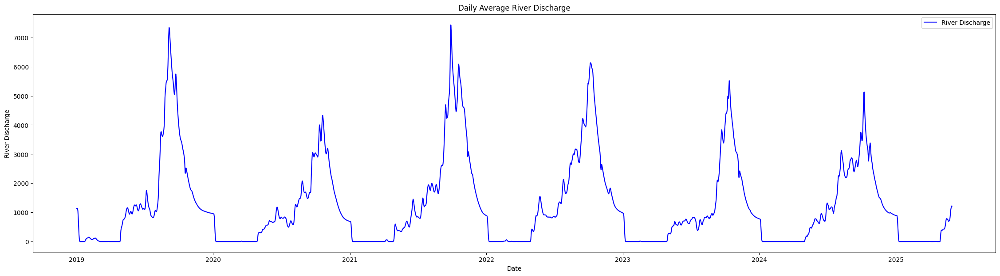

In [21]:
plt.figure(figsize=(28, 7))
plt.plot(df_daily.index, df_daily['river_discharge'], label='River Discharge', color='blue')
plt.title('Daily Average River Discharge')
plt.xlabel('Date')
plt.ylabel('River Discharge')
plt.legend()
plt.show()

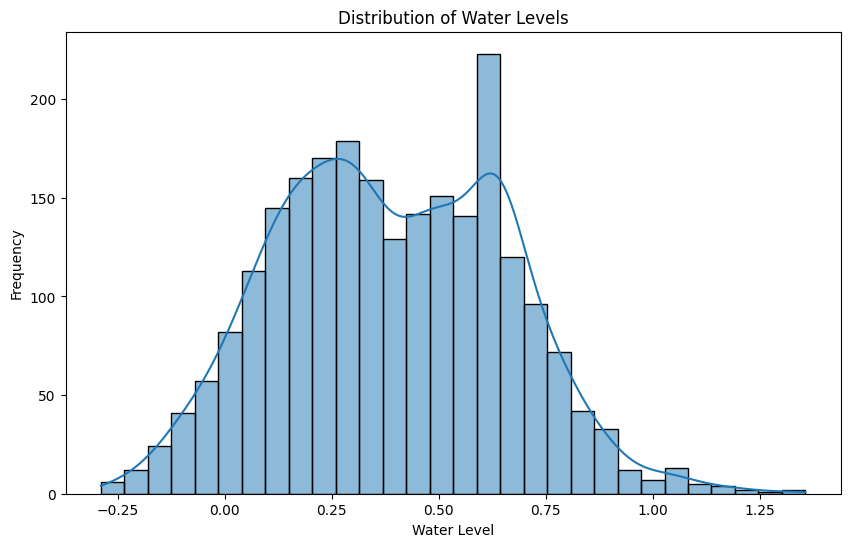

In [22]:
# Distribution of water levels
plt.figure(figsize=(10, 6))
sns.histplot(df_daily['water_level'], bins=30, kde=True)
plt.title('Distribution of Water Levels')
plt.xlabel('Water Level')
plt.ylabel('Frequency')
plt.show()

In [23]:
df_daily.describe()

,water_level,temperature_2m,rain,showers,cloud_cover,relative_humidity_2m,dew_point_2m,precipitation,weather_code,pressure_msl,surface_pressure,wind_speed_10m,wind_direction_10m,wind_gusts_10m,et0_fao_evapotranspiration,river_discharge,water_level_pct
count,2343.000000,2343.000000,2343.000000,2343.0,2343.000000,2343.000000,2343.000000,2343.000000,2343.000000,2343.000000,2343.000000,2343.000000,2343.000000,2343.000000,2343.000000,2343.000000,2343.000000
mean,0.390225,28.193141,0.179494,0.0,69.235524,74.350494,22.830203,0.179494,12.820102,1009.349577,1009.249577,9.426142,180.359386,20.077043,0.183186,1223.418451,90.085802
std,0.269097,1.753753,0.304610,0.0,28.496241,9.223252,2.882363,0.304610,12.143622,2.704624,2.704624,3.071295,54.379316,5.131952,0.041681,1467.460437,1.506616
min,-0.290069,20.241667,0.000000,0.0,0.000000,40.416667,9.679167,0.000000,0.000000,1001.941667,1001.841667,2.958333,26.916667,9.845833,0.033333,0.000000,86.276975
25%,0.181319,27.260417,0.000000,0.0,46.979167,69.604167,22.229167,0.000000,2.458333,1007.289583,1007.189583,7.127083,156.875000,16.172917,0.158333,0.192812,88.916183
50%,0.378542,28.270833,0.041667,0.0,76.833333,75.791667,24.012500,0.041667,9.208333,1009.204167,1009.104167,9.037500,186.583333,19.304167,0.185000,819.926667,90.020389
75%,0.610937,29.256250,0.245833,0.0,95.416667,80.916667,24.635417,0.245833,19.187500,1011.318750,1011.218750,11.283333,218.229167,23.389583,0.210000,1715.285313,91.321525
max,1.357361,33.179167,3.400000,0.0,100.000000,92.291667,26.675000,3.400000,59.416667,1018.270833,1018.170833,20.291667,321.750000,43.175000,0.307917,7430.695833,95.500594


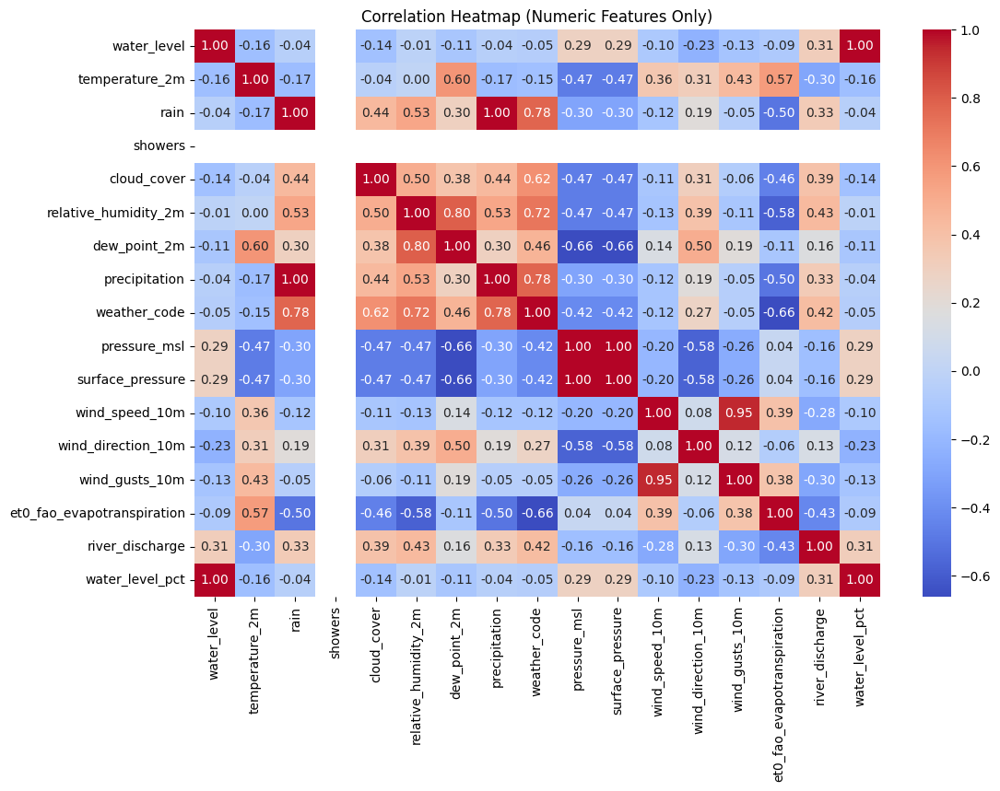

In [24]:
# Create a correlation heatmap (using only numeric columns)
plt.figure(figsize=(12, 8))

# Select only numeric columns (exclude 'risk_level' which is categorical)
numeric_cols = df_daily.select_dtypes(include=[np.number]).columns
df_daily_numeric = df_daily[numeric_cols]

correlation_matrix = df_daily_numeric.corr()
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Heatmap (Numeric Features Only)')
plt.show()

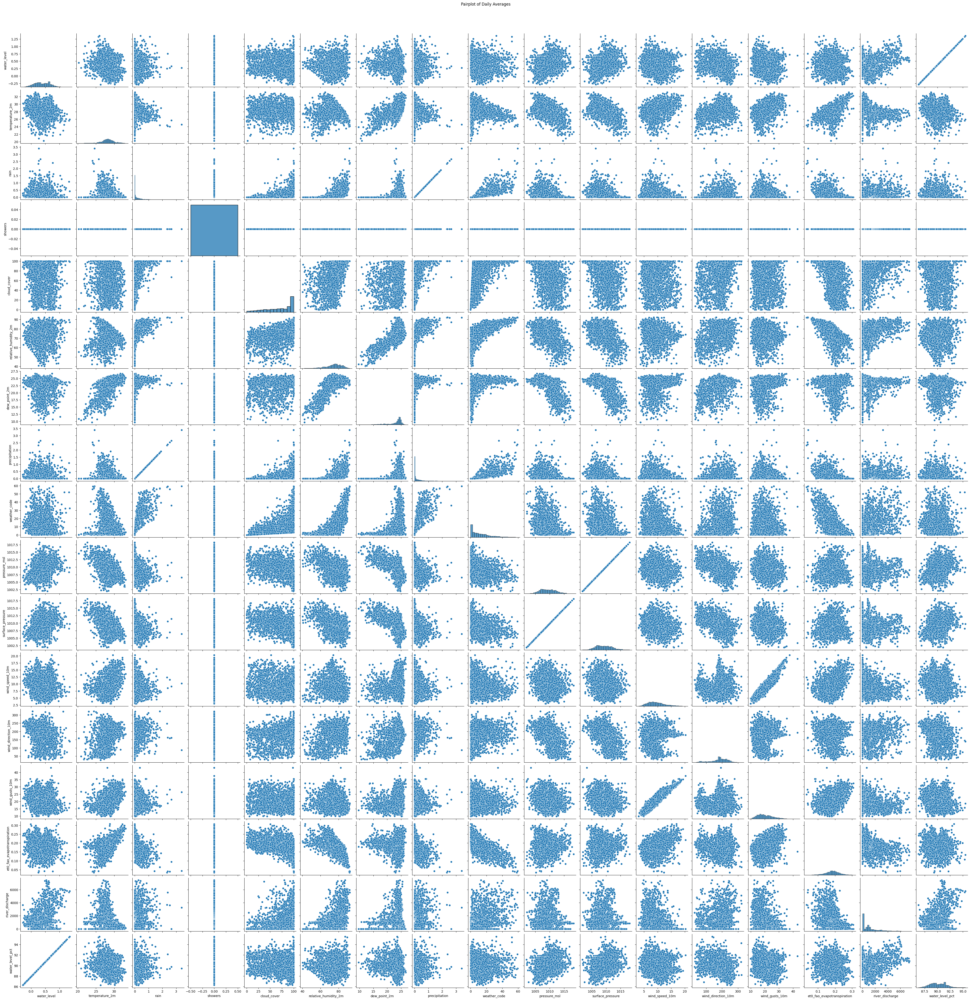

In [25]:
# Create a pairplot to visualize relationships between variables
sns.pairplot(df_daily)
plt.suptitle('Pairplot of Daily Averages', y=1.02)
plt.show()

In [26]:
df_daily.isna().sum()

water_level                   0
temperature_2m                0
rain                          0
showers                       0
cloud_cover                   0
relative_humidity_2m          0
dew_point_2m                  0
precipitation                 0
weather_code                  0
pressure_msl                  0
surface_pressure              0
wind_speed_10m                0
wind_direction_10m            0
wind_gusts_10m                0
et0_fao_evapotranspiration    0
river_discharge               0
water_level_pct               0
risk_level                    0
dtype: int64

# Feature Engineering & Advanced EDA

Now we'll focus on creating and analyzing features that can help predict water level.

## 1. Temporal Feature Extraction

Extract time-based features that may influence water levels (hour, day of week, month, season, etc.)

In [27]:
# Create a copy for feature engineering
df_fe = df_daily.copy()

# Extract temporal features
df_fe['hour'] = df_fe.index.hour
df_fe['day'] = df_fe.index.day
df_fe['month'] = df_fe.index.month
df_fe['year'] = df_fe.index.year
df_fe['day_of_week'] = df_fe.index.dayofweek
df_fe['day_of_year'] = df_fe.index.dayofyear
df_fe['week_of_year'] = df_fe.index.isocalendar().week
df_fe['quarter'] = df_fe.index.quarter

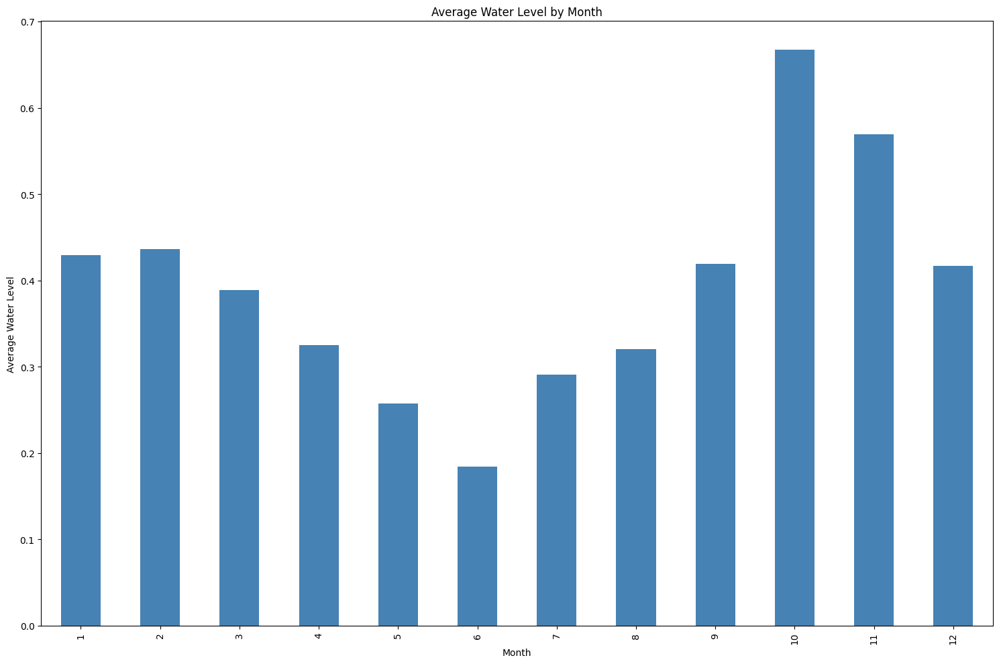

In [28]:
# Visualize seasonal patterns
fig, axes = plt.subplots(1, 1, figsize=(15, 10))

# Monthly pattern
df_fe.groupby('month')['water_level'].mean().plot(kind='bar', ax=axes, color='steelblue')
axes.set_title('Average Water Level by Month')
axes.set_xlabel('Month')
axes.set_ylabel('Average Water Level')

plt.tight_layout()
plt.show()

## 2. Missing Data Analysis

Understanding missing data patterns is crucial for data quality and model performance.

In [29]:
# Analyze missing data
missing_data = df_daily.isnull().sum()
missing_percent = (missing_data / len(df_daily)) * 100

missing_df = pd.DataFrame({
    'Missing_Count': missing_data,
    'Percentage': missing_percent
}).sort_values('Percentage', ascending=False)

print("Missing Data Summary:")
print(missing_df[missing_df['Missing_Count'] > 0])

# Visualize missing data
if missing_df['Missing_Count'].sum() > 0:
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    
    # Bar plot of missing data
    missing_df[missing_df['Missing_Count'] > 0].plot(
        y='Percentage', kind='barh', ax=axes[0], color='coral'
    )
    axes[0].set_title('Percentage of Missing Data by Feature')
    axes[0].set_xlabel('Percentage (%)')
    
    # Heatmap of missing data pattern
    sns.heatmap(df_daily.isnull().T, cbar=False, cmap='viridis', ax=axes[1])
    axes[1].set_title('Missing Data Pattern')
    axes[1].set_xlabel('Index')
    
    plt.tight_layout()
    plt.show()
else:
    print("\nNo missing data found!")

Missing Data Summary:
Empty DataFrame
Columns: [Missing_Count, Percentage]
Index: []

No missing data found!


## 3. Outlier Detection

Identify outliers in key variables that might affect water level predictions.


water_level:
  Lower Bound: -0.46, Upper Bound: 1.26
  Outliers: 3 (0.13%)

temperature_2m:
  Lower Bound: 24.27, Upper Bound: 32.25
  Outliers: 85 (3.63%)

precipitation:
  Lower Bound: -0.37, Upper Bound: 0.61
  Outliers: 175 (7.47%)

rain:
  Lower Bound: -0.37, Upper Bound: 0.61
  Outliers: 175 (7.47%)

wind_speed_10m:
  Lower Bound: 0.89, Upper Bound: 17.52
  Outliers: 23 (0.98%)

relative_humidity_2m:
  Lower Bound: 52.64, Upper Bound: 97.89
  Outliers: 68 (2.90%)


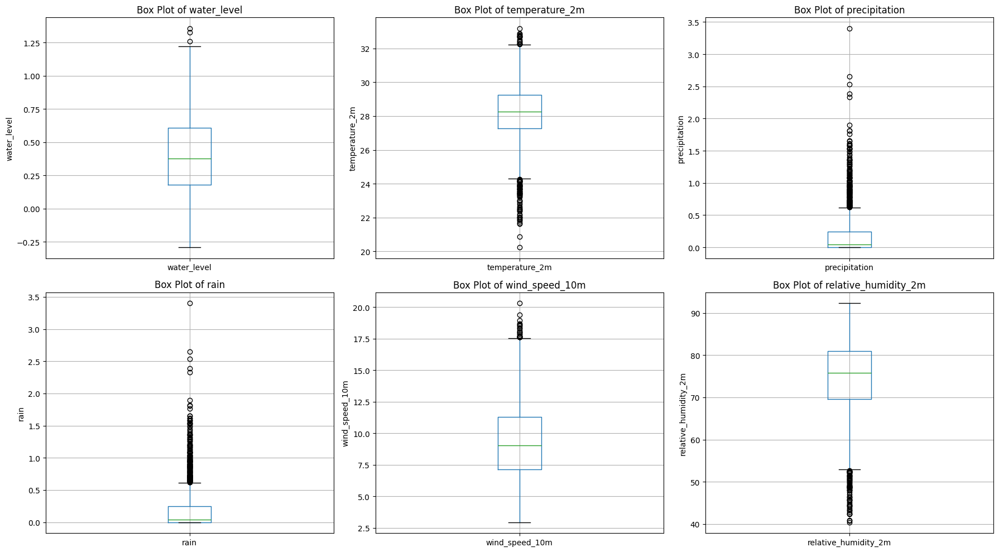

In [30]:
# Detect outliers using IQR method
def detect_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers, lower_bound, upper_bound

# Key columns to check for outliers
key_columns = ['water_level', 'temperature_2m', 'precipitation', 'rain', 
               'wind_speed_10m', 'relative_humidity_2m']

outlier_counts = {}
for col in key_columns:
    if col in df_daily.columns:
        outliers, lb, ub = detect_outliers_iqr(df_daily, col)
        outlier_counts[col] = len(outliers)
        print(f"\n{col}:")
        print(f"  Lower Bound: {lb:.2f}, Upper Bound: {ub:.2f}")
        print(f"  Outliers: {len(outliers)} ({len(outliers)/len(df_daily)*100:.2f}%)")

# Visualize outliers with box plots
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.ravel()

for idx, col in enumerate(key_columns):
    if col in df_daily.columns:
        df_daily.boxplot(column=col, ax=axes[idx])
        axes[idx].set_title(f'Box Plot of {col}')
        axes[idx].set_ylabel(col)

plt.tight_layout()
plt.show()

## 4. Distribution Analysis & Skewness

Understanding the distribution of variables is important for choosing appropriate models and transformations.

Skewness Analysis:
                       Feature  Skewness
2                         rain  3.195312
7                precipitation  3.195312
6                 dew_point_2m -1.702869
15             river_discharge  1.558220
8                 weather_code  1.203724
5         relative_humidity_2m -0.833499
12          wind_direction_10m -0.694550
4                  cloud_cover -0.667026
11              wind_speed_10m  0.600080
13              wind_gusts_10m  0.568799
1               temperature_2m -0.462631
10            surface_pressure  0.244065
9                 pressure_msl  0.244065
14  et0_fao_evapotranspiration -0.238740
16             water_level_pct  0.135460
0                  water_level  0.135460
3                      showers  0.000000


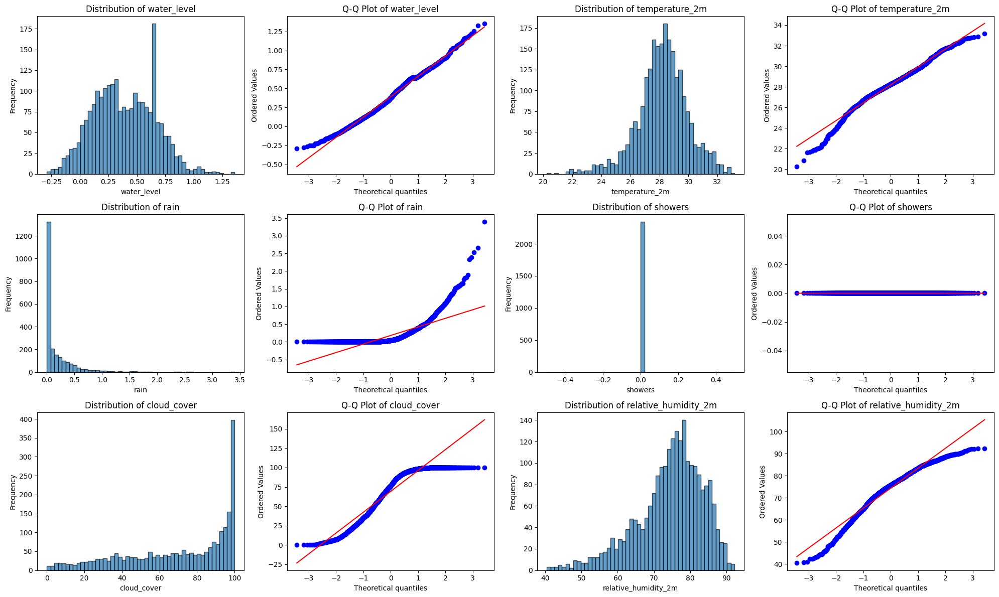

In [31]:
# Calculate skewness for all numeric columns
from scipy import stats

skewness_data = []
for col in df_daily.select_dtypes(include=[np.number]).columns:
    skew = df_daily[col].skew()
    skewness_data.append({'Feature': col, 'Skewness': skew})

skewness_df = pd.DataFrame(skewness_data).sort_values('Skewness', key=abs, ascending=False)
print("Skewness Analysis:")
print(skewness_df)

# Visualize distributions with histograms and Q-Q plots
fig, axes = plt.subplots(3, 4, figsize=(20, 12))
axes = axes.ravel()

numeric_cols = df_daily.select_dtypes(include=[np.number]).columns[:6]

for idx, col in enumerate(numeric_cols):
    # Histogram with KDE
    axes[idx*2].hist(df_daily[col].dropna(), bins=50, edgecolor='black', alpha=0.7)
    axes[idx*2].set_title(f'Distribution of {col}')
    axes[idx*2].set_xlabel(col)
    axes[idx*2].set_ylabel('Frequency')
    
    # Q-Q plot
    stats.probplot(df_daily[col].dropna(), dist="norm", plot=axes[idx*2+1])
    axes[idx*2+1].set_title(f'Q-Q Plot of {col}')

plt.tight_layout()
plt.show()

## 5. Lag Correlation Analysis

Analyze how water levels correlate with lagged values of features (e.g., rainfall from previous days).

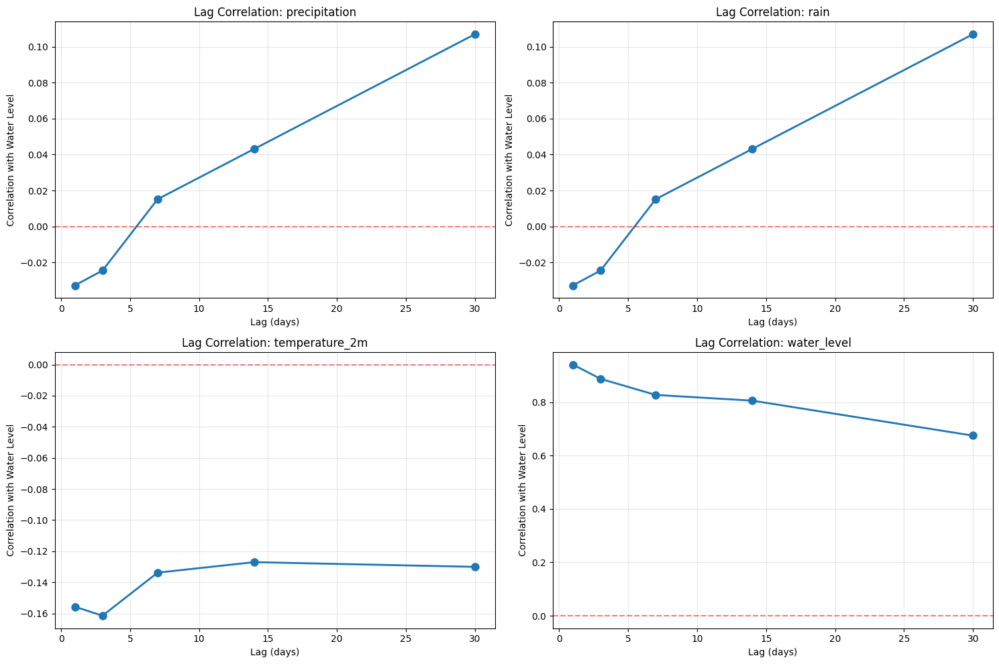


Lag Correlation Summary:

precipitation:
  Lag 1 days: -0.0328
  Lag 3 days: -0.0245
  Lag 7 days: 0.0152
  Lag 14 days: 0.0431
  Lag 30 days: 0.1069

rain:
  Lag 1 days: -0.0328
  Lag 3 days: -0.0245
  Lag 7 days: 0.0152
  Lag 14 days: 0.0431
  Lag 30 days: 0.1069

temperature_2m:
  Lag 1 days: -0.1557
  Lag 3 days: -0.1615
  Lag 7 days: -0.1338
  Lag 14 days: -0.1270
  Lag 30 days: -0.1301

water_level:
  Lag 1 days: 0.9417
  Lag 3 days: 0.8881
  Lag 7 days: 0.8279
  Lag 14 days: 0.8064
  Lag 30 days: 0.6752


In [32]:
# Create lagged features for key variables
lag_periods = [1, 3, 7, 14, 30]  # 1 day, 3 days, 1 week, 2 weeks, 1 month
key_features = ['precipitation', 'rain', 'temperature_2m', 'water_level']

# Calculate correlations with lagged features
lag_correlations = {}

for feature in key_features:
    if feature in df_daily.columns:
        correlations = []
        for lag in lag_periods:
            lagged_feature = df_daily[feature].shift(lag)
            corr = df_daily['water_level'].corr(lagged_feature)
            correlations.append(corr)
        lag_correlations[feature] = correlations

# Visualize lag correlations
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.ravel()

for idx, (feature, corrs) in enumerate(lag_correlations.items()):
    axes[idx].plot(lag_periods, corrs, marker='o', linewidth=2, markersize=8)
    axes[idx].set_xlabel('Lag (days)')
    axes[idx].set_ylabel('Correlation with Water Level')
    axes[idx].set_title(f'Lag Correlation: {feature}')
    axes[idx].grid(True, alpha=0.3)
    axes[idx].axhline(y=0, color='r', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

# Print correlation values
print("\nLag Correlation Summary:")
for feature, corrs in lag_correlations.items():
    print(f"\n{feature}:")
    for lag, corr in zip(lag_periods, corrs):
        print(f"  Lag {lag} days: {corr:.4f}")

## 6. Rolling Window Statistics

Analyze trends using rolling means and standard deviations.

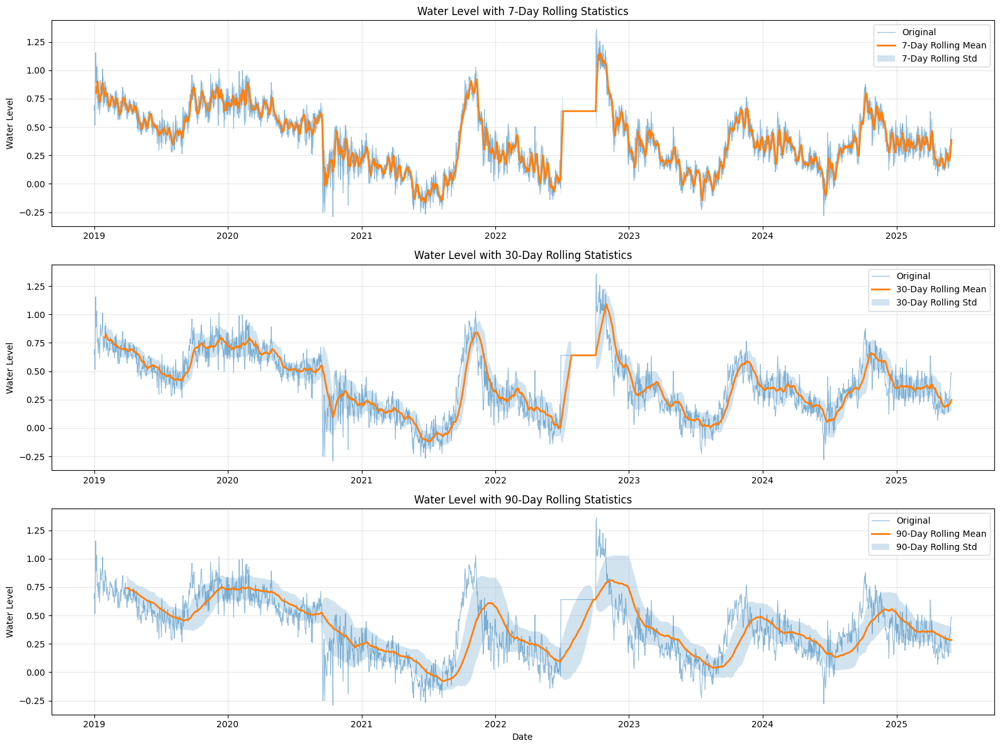

In [33]:
# Calculate rolling statistics for water level
windows = [7, 30, 90]  # Weekly, monthly, and quarterly windows

fig, axes = plt.subplots(3, 1, figsize=(16, 12))

for idx, window in enumerate(windows):
    rolling_mean = df_daily['water_level'].rolling(window=window).mean()
    rolling_std = df_daily['water_level'].rolling(window=window).std()
    
    axes[idx].plot(df_daily.index, df_daily['water_level'], 
                   label='Original', alpha=0.5, linewidth=0.8)
    axes[idx].plot(df_daily.index, rolling_mean, 
                   label=f'{window}-Day Rolling Mean', linewidth=2)
    axes[idx].fill_between(df_daily.index, 
                           rolling_mean - rolling_std, 
                           rolling_mean + rolling_std,
                           alpha=0.2, label=f'{window}-Day Rolling Std')
    axes[idx].set_title(f'Water Level with {window}-Day Rolling Statistics')
    axes[idx].set_ylabel('Water Level')
    axes[idx].legend()
    axes[idx].grid(True, alpha=0.3)

axes[-1].set_xlabel('Date')
plt.tight_layout()
plt.show()

## 7. Weather Impact Analysis

Analyze how different weather conditions affect water levels.

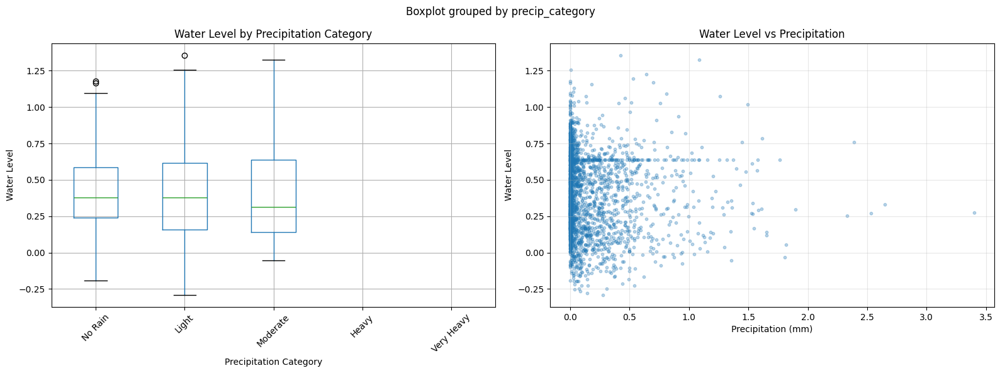


Water Level Statistics by Precipitation Category:
                  count      mean       std       min       25%       50%  \
precip_category                                                             
No Rain           655.0  0.417160  0.241728 -0.189653  0.240937  0.379167   
Light            1621.0  0.379542  0.278120 -0.290069  0.157708  0.380556   
Moderate           67.0  0.385371  0.286208 -0.055625  0.140868  0.315417   
Heavy               0.0       NaN       NaN       NaN       NaN       NaN   
Very Heavy          0.0       NaN       NaN       NaN       NaN       NaN   

                      75%       max  
precip_category                      
No Rain          0.588472  1.177014  
Light            0.615069  1.357361  
Moderate         0.638160  1.327014  
Heavy                 NaN       NaN  
Very Heavy            NaN       NaN  


C:\Users\USER\AppData\Local\Temp\ipykernel_32052\540412742.py:32: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df_daily.groupby('precip_category')['water_level'].describe())


In [34]:
# Analyze precipitation impact
if 'precipitation' in df_daily.columns:
    # Categorize precipitation levels
    df_daily['precip_category'] = pd.cut(df_daily['precipitation'], 
                                          bins=[-0.01, 0, 1, 5, 10, 100],
                                          labels=['No Rain', 'Light', 'Moderate', 'Heavy', 'Very Heavy'])
    
    # Water level by precipitation category
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Box plot
    df_daily.boxplot(column='water_level', by='precip_category', ax=axes[0])
    axes[0].set_title('Water Level by Precipitation Category')
    axes[0].set_xlabel('Precipitation Category')
    axes[0].set_ylabel('Water Level')
    plt.sca(axes[0])
    plt.xticks(rotation=45)
    
    # Scatter plot
    axes[1].scatter(df_daily['precipitation'], df_daily['water_level'], 
                    alpha=0.3, s=10)
    axes[1].set_xlabel('Precipitation (mm)')
    axes[1].set_ylabel('Water Level')
    axes[1].set_title('Water Level vs Precipitation')
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Statistical summary
    print("\nWater Level Statistics by Precipitation Category:")
    print(df_daily.groupby('precip_category')['water_level'].describe())

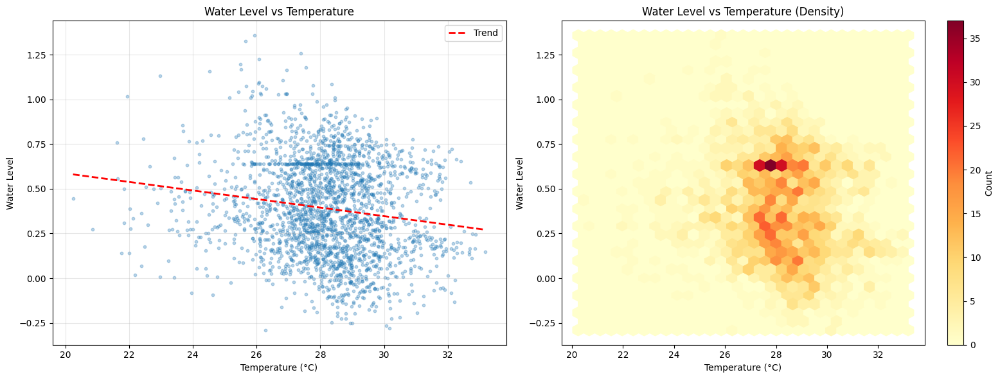

In [35]:
# Temperature impact on water level
if 'temperature_2m' in df_daily.columns:
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Scatter plot with trend line
    axes[0].scatter(df_daily['temperature_2m'], df_daily['water_level'], 
                    alpha=0.3, s=10)
    
    # Add trend line
    z = np.polyfit(df_daily['temperature_2m'].dropna(), 
                   df_daily.loc[df_daily['temperature_2m'].notna(), 'water_level'], 1)
    p = np.poly1d(z)
    axes[0].plot(df_daily['temperature_2m'].sort_values(), 
                 p(df_daily['temperature_2m'].sort_values()), 
                 "r--", linewidth=2, label='Trend')
    axes[0].set_xlabel('Temperature (°C)')
    axes[0].set_ylabel('Water Level')
    axes[0].set_title('Water Level vs Temperature')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)
    
    # Hexbin plot for density
    axes[1].hexbin(df_daily['temperature_2m'], df_daily['water_level'], 
                   gridsize=30, cmap='YlOrRd')
    axes[1].set_xlabel('Temperature (°C)')
    axes[1].set_ylabel('Water Level')
    axes[1].set_title('Water Level vs Temperature (Density)')
    plt.colorbar(axes[1].collections[0], ax=axes[1], label='Count')
    
    plt.tight_layout()
    plt.show()

## 8. Time Series Autocorrelation

Analyze autocorrelation to understand the time series structure and seasonality.

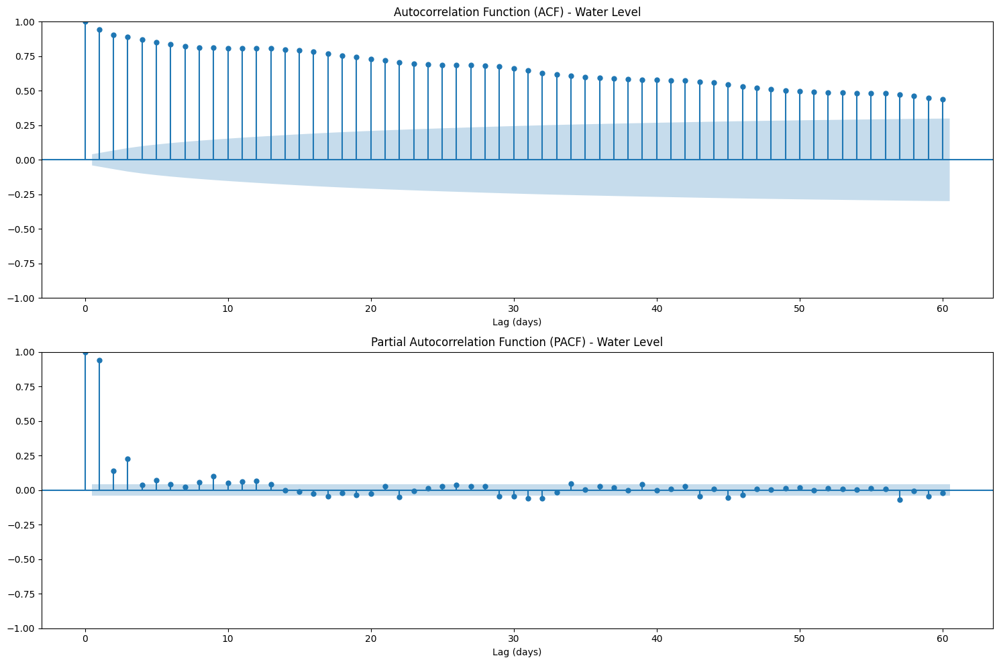


Autocorrelation Analysis:
- ACF shows overall correlation at different lags
- PACF shows direct correlation after removing effects of shorter lags
- Significant spikes indicate important lag periods for modeling


In [36]:
# Autocorrelation and Partial Autocorrelation plots
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig, axes = plt.subplots(2, 1, figsize=(15, 10))

# Autocorrelation Function (ACF)
plot_acf(df_daily['water_level'].dropna(), lags=60, ax=axes[0])
axes[0].set_title('Autocorrelation Function (ACF) - Water Level')
axes[0].set_xlabel('Lag (days)')

# Partial Autocorrelation Function (PACF)
plot_pacf(df_daily['water_level'].dropna(), lags=60, ax=axes[1])
axes[1].set_title('Partial Autocorrelation Function (PACF) - Water Level')
axes[1].set_xlabel('Lag (days)')

plt.tight_layout()
plt.show()

print("\nAutocorrelation Analysis:")
print("- ACF shows overall correlation at different lags")
print("- PACF shows direct correlation after removing effects of shorter lags")
print("- Significant spikes indicate important lag periods for modeling")

## 9. Cumulative Precipitation Analysis

Analyze cumulative effects of precipitation over different time windows.

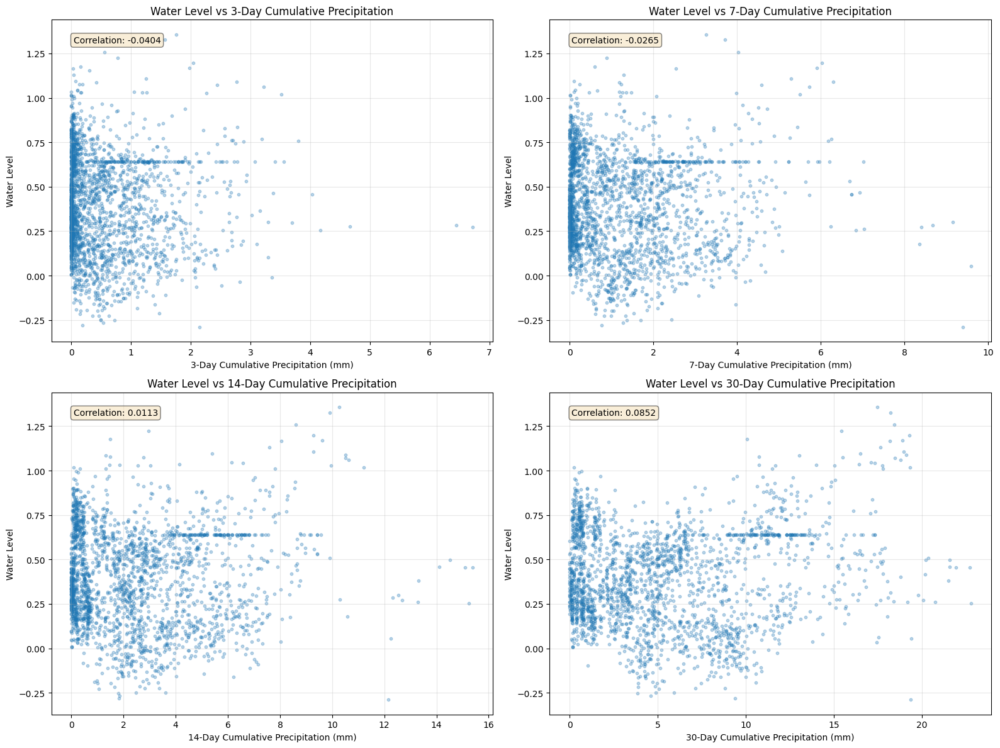


Cumulative Precipitation Correlation Summary:
3-day cumulative precipitation: -0.0404
7-day cumulative precipitation: -0.0265
14-day cumulative precipitation: 0.0113
30-day cumulative precipitation: 0.0852


In [37]:
# Calculate cumulative precipitation over different windows
if 'precipitation' in df_daily.columns:
    cumulative_windows = [3, 7, 14, 30]
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.ravel()
    
    for idx, window in enumerate(cumulative_windows):
        # Calculate cumulative precipitation
        df_daily[f'precip_cum_{window}d'] = df_daily['precipitation'].rolling(window=window).sum()
        
        # Scatter plot
        axes[idx].scatter(df_daily[f'precip_cum_{window}d'], 
                         df_daily['water_level'], 
                         alpha=0.3, s=10)
        axes[idx].set_xlabel(f'{window}-Day Cumulative Precipitation (mm)')
        axes[idx].set_ylabel('Water Level')
        axes[idx].set_title(f'Water Level vs {window}-Day Cumulative Precipitation')
        axes[idx].grid(True, alpha=0.3)
        
        # Calculate correlation
        corr = df_daily['water_level'].corr(df_daily[f'precip_cum_{window}d'])
        axes[idx].text(0.05, 0.95, f'Correlation: {corr:.4f}',
                      transform=axes[idx].transAxes,
                      verticalalignment='top',
                      bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.tight_layout()
    plt.show()
    
    # Print correlation summary
    print("\nCumulative Precipitation Correlation Summary:")
    for window in cumulative_windows:
        corr = df_daily['water_level'].corr(df_daily[f'precip_cum_{window}d'])
        print(f"{window}-day cumulative precipitation: {corr:.4f}")

## 10. Feature Correlation Matrix (Advanced)

Create a detailed correlation matrix focusing on the most relevant features for water level prediction.

Top 20 Features Correlated with Water Level:
water_level_pct               1.000000
water_level                   1.000000
river_discharge               0.314473
surface_pressure              0.290547
pressure_msl                  0.290547
precip_cum_30d                0.085155
precip_cum_14d                0.011255
relative_humidity_2m         -0.013408
precip_cum_7d                -0.026520
precip_cum_3d                -0.040413
rain                         -0.042230
precipitation                -0.042230
weather_code                 -0.054362
et0_fao_evapotranspiration   -0.085394
wind_speed_10m               -0.095501
dew_point_2m                 -0.111454
wind_gusts_10m               -0.125576
cloud_cover                  -0.143671
temperature_2m               -0.156011
wind_direction_10m           -0.229997
Name: water_level, dtype: float64


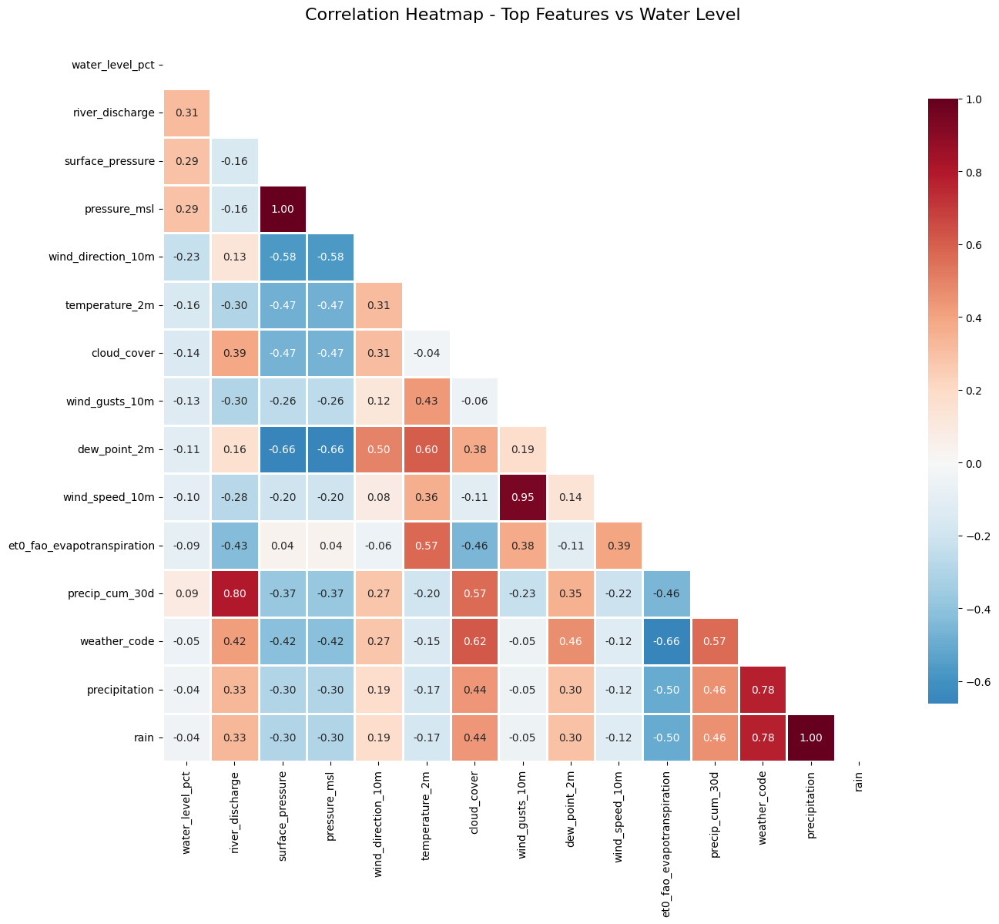



Highly Correlated Feature Pairs (|correlation| > 0.7):
          Feature 1       Feature 2  Correlation
1  surface_pressure    pressure_msl     1.000000
5     precipitation            rain     1.000000
2    wind_gusts_10m  wind_speed_10m     0.946553
0   river_discharge  precip_cum_30d     0.803846
3      weather_code   precipitation     0.775821
4      weather_code            rain     0.775821


In [38]:
# Get correlations with water level using only numeric columns to avoid string categories (e.g., 'No Rain')
numeric_df = df_daily.select_dtypes(include=[np.number]).copy()

if 'water_level' not in numeric_df.columns:
    raise KeyError("water_level column not found among numeric columns in df_daily")

correlations = numeric_df.corr()['water_level'].sort_values(ascending=False)
print("Top 20 Features Correlated with Water Level:")
print(correlations.head(20))

# Select top correlated features for detailed heatmap (exclude water_level itself)
top_features = correlations.abs().sort_values(ascending=False).head(16).index.tolist()
top_features = [f for f in top_features if f != 'water_level']  # ensure target not included

# Create correlation matrix for top features (only numeric)
feature_corr_matrix = numeric_df[top_features].corr()

# Plot enhanced correlation heatmap if we have at least 2 features
if feature_corr_matrix.shape[0] >= 2:
    plt.figure(figsize=(14, 12))
    mask = np.triu(np.ones_like(feature_corr_matrix, dtype=bool))
    sns.heatmap(feature_corr_matrix, 
                mask=mask,
                annot=True, 
                fmt=".2f", 
                cmap='RdBu_r',
                center=0,
                square=True,
                linewidths=1,
                cbar_kws={"shrink": 0.8})
    plt.title('Correlation Heatmap - Top Features vs Water Level', fontsize=16, pad=20)
    plt.tight_layout()
    plt.show()
else:
    print("Not enough numeric features to plot a correlation heatmap.")

# Identify highly correlated feature pairs (potential multicollinearity)
print("\n\nHighly Correlated Feature Pairs (|correlation| > 0.7):")
high_corr_pairs = []
cols = feature_corr_matrix.columns.tolist()
for i in range(len(cols)):
    for j in range(i+1, len(cols)):
        val = feature_corr_matrix.iloc[i, j]
        if abs(val) > 0.7:
            high_corr_pairs.append({
                'Feature 1': cols[i],
                'Feature 2': cols[j],
                'Correlation': val
            })

high_corr_df = pd.DataFrame(high_corr_pairs)
if not high_corr_df.empty:
    high_corr_df = high_corr_df.sort_values('Correlation', key=abs, ascending=False)
print(high_corr_df)

## 11. Year-over-Year Comparison

Compare water levels across different years to identify trends and anomalies.

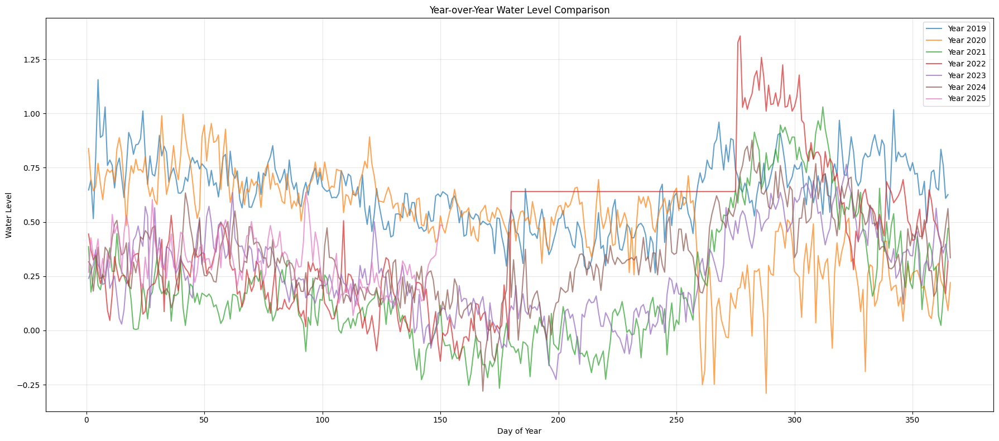


Annual Water Level Statistics:
       mean  median    std    min    max
year                                    
2019  0.637   0.647  0.151  0.265  1.156
2020  0.496   0.545  0.230 -0.290  0.997
2021  0.204   0.140  0.286 -0.266  1.030
2022  0.438   0.430  0.311 -0.142  1.357
2023  0.262   0.243  0.198 -0.226  0.766
2024  0.334   0.317  0.189 -0.280  0.877
2025  0.314   0.313  0.112  0.068  0.636


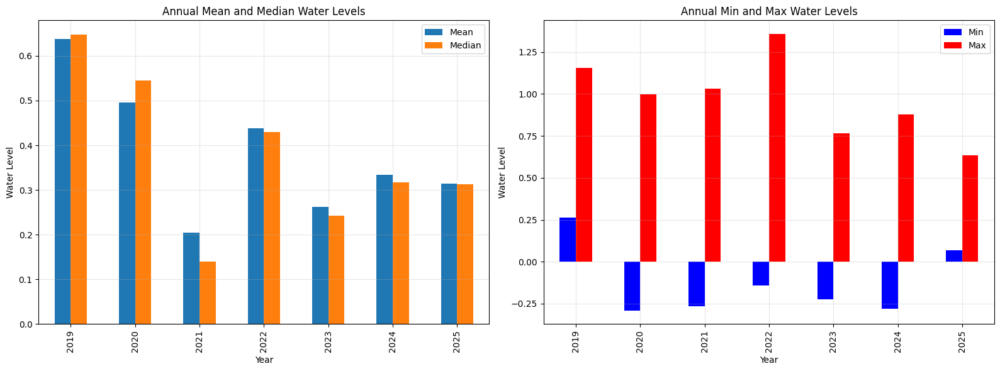

In [39]:
# Year-over-Year comparison
df_daily['year'] = df_daily.index.year
df_daily['day_of_year'] = df_daily.index.dayofyear

# Plot water levels by year
plt.figure(figsize=(18, 8))
for year in sorted(df_daily['year'].unique()):
    year_data = df_daily[df_daily['year'] == year]
    plt.plot(year_data['day_of_year'], year_data['water_level'], 
             label=f'Year {year}', alpha=0.7, linewidth=1.5)

plt.xlabel('Day of Year')
plt.ylabel('Water Level')
plt.title('Year-over-Year Water Level Comparison')
plt.legend(loc='best')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Annual statistics
annual_stats = df_daily.groupby('year')['water_level'].agg([
    'mean', 'median', 'std', 'min', 'max'
]).round(3)

print("\nAnnual Water Level Statistics:")
print(annual_stats)

# Visualize annual statistics
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

annual_stats[['mean', 'median']].plot(kind='bar', ax=axes[0])
axes[0].set_title('Annual Mean and Median Water Levels')
axes[0].set_ylabel('Water Level')
axes[0].set_xlabel('Year')
axes[0].legend(['Mean', 'Median'])
axes[0].grid(True, alpha=0.3)

annual_stats[['min', 'max']].plot(kind='bar', ax=axes[1], color=['blue', 'red'])
axes[1].set_title('Annual Min and Max Water Levels')
axes[1].set_ylabel('Water Level')
axes[1].set_xlabel('Year')
axes[1].legend(['Min', 'Max'])
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## 12. Extreme Events Analysis

Identify and analyze extreme water level events (floods/droughts).

EXTREME EVENTS ANALYSIS

Based on Risk Classification:
  High Flood Risk Threshold: ≥ 70% (-3.197 m.MSL)
  Critical Low Water Threshold: < 10% (-13.914 m.MSL)

Extreme High Water Events (Flood Risk ≥ 70%):
  Count: 2343 days (100.00%)
  Water Level Range: -0.290 to 1.357 m.MSL
  Percentage Range: 86.3% to 95.5%

Extreme Low Water Events (Critical < 10%):
  Count: 0 days (0.00%)


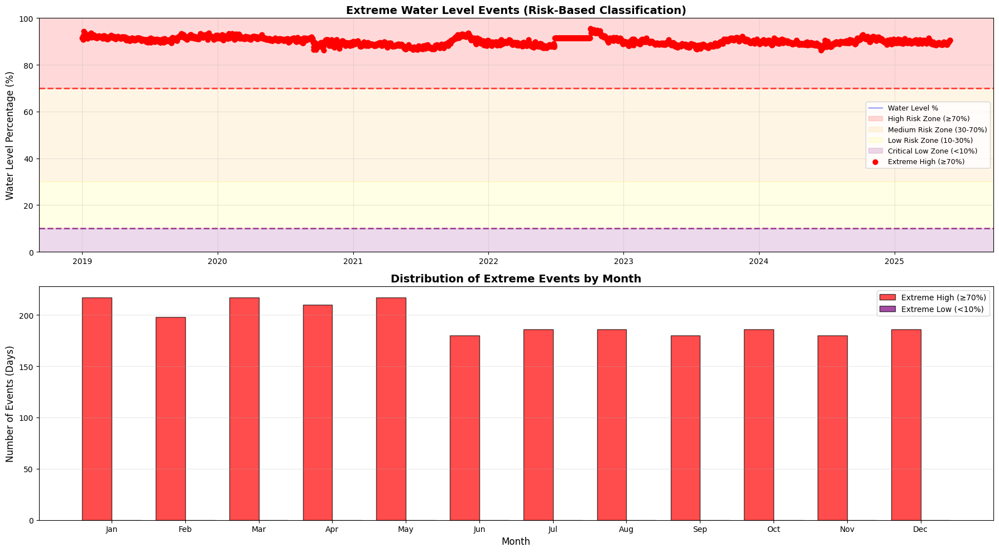


WEATHER CONDITIONS DURING EXTREME EVENTS

Extreme High Water Events (Flood Risk ≥70%):
--------------------------------------------------------------------------------
       water_level  water_level_pct  precipitation  temperature_2m      rain  \
count     2343.000         2343.000       2343.000        2343.000  2343.000   
mean         0.390           90.086          0.179          28.193     0.179   
std          0.269            1.507          0.305           1.754     0.305   
min         -0.290           86.277          0.000          20.242     0.000   
25%          0.181           88.916          0.000          27.260     0.000   
50%          0.379           90.020          0.042          28.271     0.042   
75%          0.611           91.322          0.246          29.256     0.246   
max          1.357           95.501          3.400          33.179     3.400   

       river_discharge  
count         2343.000  
mean          1223.418  
std           1467.460  
min       

In [40]:
# Define extreme events based on risk classification (not percentiles)
# Using the water level percentage thresholds:
# - Extreme High (น้ำมาก - Flood Risk): water_level_pct >= 70%
# - Critical Low (น้ำน้อยวิกฤต): water_level_pct < 10%

# Station parameters (needed for threshold calculations)
BANK_LEVEL = 2.161  # Top of riverbank (m.MSL)
BED_LEVEL = -15.70  # River bed level (m.MSL)
TOTAL_CAPACITY = BANK_LEVEL - BED_LEVEL

# Identify extreme events based on risk zones
extreme_high = df_daily[df_daily['water_level_pct'] >= 70]  # High flood risk
extreme_low = df_daily[df_daily['water_level_pct'] < 10]    # Critically low water

# Calculate corresponding water levels
high_threshold_pct = 70  # 70% of capacity
low_threshold_pct = 10   # 10% of capacity

# Convert percentage back to actual water level (m.MSL) for reference
high_threshold_level = BED_LEVEL + (TOTAL_CAPACITY * high_threshold_pct / 100)
low_threshold_level = BED_LEVEL + (TOTAL_CAPACITY * low_threshold_pct / 100)

print("="*80)
print("EXTREME EVENTS ANALYSIS")
print("="*80)
print(f"\nBased on Risk Classification:")
print(f"  High Flood Risk Threshold: ≥ {high_threshold_pct}% ({high_threshold_level:.3f} m.MSL)")
print(f"  Critical Low Water Threshold: < {low_threshold_pct}% ({low_threshold_level:.3f} m.MSL)")
print(f"\nExtreme High Water Events (Flood Risk ≥ 70%):")
print(f"  Count: {len(extreme_high)} days ({len(extreme_high)/len(df_daily)*100:.2f}%)")
if len(extreme_high) > 0:
    print(f"  Water Level Range: {extreme_high['water_level'].min():.3f} to {extreme_high['water_level'].max():.3f} m.MSL")
    print(f"  Percentage Range: {extreme_high['water_level_pct'].min():.1f}% to {extreme_high['water_level_pct'].max():.1f}%")

print(f"\nExtreme Low Water Events (Critical < 10%):")
print(f"  Count: {len(extreme_low)} days ({len(extreme_low)/len(df_daily)*100:.2f}%)")
if len(extreme_low) > 0:
    print(f"  Water Level Range: {extreme_low['water_level'].min():.3f} to {extreme_low['water_level'].max():.3f} m.MSL")
    print(f"  Percentage Range: {extreme_low['water_level_pct'].min():.1f}% to {extreme_low['water_level_pct'].max():.1f}%")
print("="*80)

# Visualize extreme events
fig, axes = plt.subplots(2, 1, figsize=(18, 10))

# Plot 1: Time series with extreme events highlighted (using water level percentage)
axes[0].plot(df_daily.index, df_daily['water_level_pct'], 
             label='Water Level %', alpha=0.6, linewidth=1, color='blue')

# Add risk zone backgrounds
axes[0].axhspan(70, 100, alpha=0.15, color='red', label='High Risk Zone (≥70%)')
axes[0].axhspan(30, 70, alpha=0.1, color='orange', label='Medium Risk Zone (30-70%)')
axes[0].axhspan(10, 30, alpha=0.1, color='yellow', label='Low Risk Zone (10-30%)')
axes[0].axhspan(0, 10, alpha=0.15, color='purple', label='Critical Low Zone (<10%)')

# Highlight extreme events
if len(extreme_high) > 0:
    axes[0].scatter(extreme_high.index, extreme_high['water_level_pct'], 
                    color='red', s=40, label='Extreme High (≥70%)', zorder=5, marker='o')
if len(extreme_low) > 0:
    axes[0].scatter(extreme_low.index, extreme_low['water_level_pct'], 
                    color='purple', s=40, label='Extreme Low (<10%)', zorder=5, marker='v')

# Add threshold lines
axes[0].axhline(y=70, color='red', linestyle='--', linewidth=2, alpha=0.7)
axes[0].axhline(y=10, color='purple', linestyle='--', linewidth=2, alpha=0.7)

axes[0].set_ylabel('Water Level Percentage (%)', fontsize=12)
axes[0].set_title('Extreme Water Level Events (Risk-Based Classification)', fontsize=14, fontweight='bold')
axes[0].legend(loc='best', fontsize=9)
axes[0].grid(True, alpha=0.3)
axes[0].set_ylim([0, 100])

# Plot 2: Monthly distribution of extreme events
if len(extreme_high) > 0:
    extreme_high_copy = extreme_high.copy()
    extreme_high_copy['month'] = extreme_high_copy.index.month
    monthly_extreme_high = extreme_high_copy.groupby('month').size()
else:
    monthly_extreme_high = pd.Series(dtype=int)

if len(extreme_low) > 0:
    extreme_low_copy = extreme_low.copy()
    extreme_low_copy['month'] = extreme_low_copy.index.month
    monthly_extreme_low = extreme_low_copy.groupby('month').size()
else:
    monthly_extreme_low = pd.Series(dtype=int)

months = range(1, 13)
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

axes[1].bar([m - 0.2 for m in months], 
            [monthly_extreme_high.get(m, 0) for m in months],
            width=0.4, label='Extreme High (≥70%)', color='red', alpha=0.7, edgecolor='black')
axes[1].bar([m + 0.2 for m in months], 
            [monthly_extreme_low.get(m, 0) for m in months],
            width=0.4, label='Extreme Low (<10%)', color='purple', alpha=0.7, edgecolor='black')
axes[1].set_xlabel('Month', fontsize=12)
axes[1].set_ylabel('Number of Events (Days)', fontsize=12)
axes[1].set_title('Distribution of Extreme Events by Month', fontsize=14, fontweight='bold')
axes[1].set_xticks(months)
axes[1].set_xticklabels(month_names)
axes[1].legend()
axes[1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

# Analyze weather conditions during extreme events
print("\n" + "="*80)
print("WEATHER CONDITIONS DURING EXTREME EVENTS")
print("="*80)

if len(extreme_high) > 0 and 'precipitation' in df_daily.columns:
    print("\nExtreme High Water Events (Flood Risk ≥70%):")
    print("-" * 80)
    print(extreme_high[['water_level', 'water_level_pct', 'precipitation', 
                        'temperature_2m', 'rain', 'river_discharge']].describe().round(3))
else:
    print("\nNo Extreme High Water Events found.")

if len(extreme_low) > 0 and 'precipitation' in df_daily.columns:
    print("\n\nExtreme Low Water Events (Critical <10%):")
    print("-" * 80)
    print(extreme_low[['water_level', 'water_level_pct', 'precipitation', 
                       'temperature_2m', 'rain', 'river_discharge']].describe().round(3))
else:
    print("\n\nNo Extreme Low Water Events found.")

## 13. Key Insights Summary

Summarize the key findings from the exploratory data analysis.

In [41]:
# Create a comprehensive summary report
print("=" * 80)
print("EXPLORATORY DATA ANALYSIS - KEY INSIGHTS SUMMARY")
print("=" * 80)

print("\n1. DATASET OVERVIEW")
print(f"   - Total observations: {len(df_daily):,}")
print(f"   - Time period: {df_daily.index.min()} to {df_daily.index.max()}")
print(f"   - Number of features: {len(df_daily.columns)}")

print("\n2. WATER LEVEL STATISTICS")
print(f"   - Mean: {df_daily['water_level'].mean():.3f}")
print(f"   - Median: {df_daily['water_level'].median():.3f}")
print(f"   - Std Dev: {df_daily['water_level'].std():.3f}")
print(f"   - Range: [{df_daily['water_level'].min():.3f}, {df_daily['water_level'].max():.3f}]")

print("\n3. DATA QUALITY")
missing_summary = df_daily.isnull().sum()
if missing_summary.sum() > 0:
    print(f"   - Features with missing data: {(missing_summary > 0).sum()}")
    print(f"   - Total missing values: {missing_summary.sum()}")
else:
    print("   - No missing data detected ✓")

print("\n4. TOP CORRELATIONS WITH WATER LEVEL")
top_5_features = correlations.abs().sort_values(ascending=False).head(6)[1:]
for feature in top_5_features.index:
    print(f"   - {feature}: {correlations[feature]:.4f}")

print("\n5. TEMPORAL PATTERNS")
# Compute monthly averages; use index month if 'month' column is not present
if 'month' in df_daily.columns:
    monthly_avg = df_daily.groupby('month')['water_level'].mean()
else:
    monthly_avg = df_daily.groupby(df_daily.index.month)['water_level'].mean()

max_month = monthly_avg.idxmax()
min_month = monthly_avg.idxmin()
print(f"   - Highest water levels: Month {max_month} (avg: {monthly_avg.max():.3f})")
print(f"   - Lowest water levels: Month {min_month} (avg: {monthly_avg.min():.3f})")

print("\n6. EXTREME EVENTS (Risk-Based Classification)")
print(f"   - Extreme high events (≥70% - Flood Risk): {len(extreme_high)} ({len(extreme_high)/len(df_daily)*100:.2f}%)")
print(f"   - Extreme low events (<10% - Critical Low): {len(extreme_low)} ({len(extreme_low)/len(df_daily)*100:.2f}%)")

print("\n7. WATER LEVEL RISK ASSESSMENT")
risk_dist = df_daily['risk_level'].value_counts()
for risk in ['High Risk', 'Medium Risk', 'Low Risk']:
    count = risk_dist.get(risk, 0)
    pct = (count / len(df_daily) * 100) if count > 0 else 0
    print(f"   - {risk}: {count} days ({pct:.2f}%)")

print("\n" + "=" * 80)
print("Analysis complete! Use these insights for feature engineering and modeling.")
print("=" * 80)

EXPLORATORY DATA ANALYSIS - KEY INSIGHTS SUMMARY

1. DATASET OVERVIEW
   - Total observations: 2,343
   - Time period: 2019-01-01 00:00:00 to 2025-05-31 00:00:00
   - Number of features: 25

2. WATER LEVEL STATISTICS
   - Mean: 0.390
   - Median: 0.379
   - Std Dev: 0.269
   - Range: [-0.290, 1.357]

3. DATA QUALITY
   - Features with missing data: 4
   - Total missing values: 50

4. TOP CORRELATIONS WITH WATER LEVEL
   - water_level: 1.0000
   - river_discharge: 0.3145
   - surface_pressure: 0.2905
   - pressure_msl: 0.2905
   - wind_direction_10m: -0.2300

5. TEMPORAL PATTERNS
   - Highest water levels: Month 10 (avg: 0.667)
   - Lowest water levels: Month 6 (avg: 0.184)

6. EXTREME EVENTS (Risk-Based Classification)
   - Extreme high events (≥70% - Flood Risk): 2343 (100.00%)
   - Extreme low events (<10% - Critical Low): 0 (0.00%)

7. WATER LEVEL RISK ASSESSMENT
   - High Risk: 2343 days (100.00%)
   - Medium Risk: 0 days (0.00%)
   - Low Risk: 0 days (0.00%)

Analysis complete! Us

# Water Level Risk Analysis

## Station CPY015 at Krungthep Bridge - Flood Risk Assessment

Based on Thailand's national standard for water level measurement relative to Mean Sea Level (m.MSL):


In [42]:
# Station Parameters for CPY015 at Krungthep Bridge
# Based on Thailand's national standard (relative to Mean Sea Level - m.MSL)

BANK_LEVEL = 2.161  # Top of riverbank (m.MSL)
BED_LEVEL = -15.70  # River bed level (m.MSL)
ZERO_POINT = 0.00   # Mean Sea Level (m.MSL)

# Calculate total vertical capacity
TOTAL_CAPACITY = BANK_LEVEL - BED_LEVEL

print("="*80)
print("STATION CPY015 - KRUNGTHEP BRIDGE")
print("Water Level Measurement Parameters")
print("="*80)
print(f"\nBank Level (Top of Riverbank): +{BANK_LEVEL} m.MSL")
print(f"Zero Point (Mean Sea Level):    {ZERO_POINT:.2f} m.MSL")
print(f"Bed Level (River Bottom):      {BED_LEVEL} m.MSL")
print(f"\nTotal Vertical Capacity: {TOTAL_CAPACITY:.2f} meters")
print("="*80)


STATION CPY015 - KRUNGTHEP BRIDGE
Water Level Measurement Parameters

Bank Level (Top of Riverbank): +2.161 m.MSL
Zero Point (Mean Sea Level):    0.00 m.MSL
Bed Level (River Bottom):      -15.7 m.MSL

Total Vertical Capacity: 17.86 meters


In [43]:
# Water Level Percentage and Risk Level
# Note: These columns are already calculated in the data acquisition phase
# and are loaded from full_merged_daily.csv

# Verify the columns exist
if 'water_level_pct' not in df_daily.columns or 'risk_level' not in df_daily.columns:
    print("⚠️ Warning: Risk assessment columns not found. Please run data_acquisition.ipynb first.")
else:
    print("✓ Risk assessment columns loaded successfully")

# Display summary statistics
print("\nWater Level Percentage Statistics:")
print(df_daily['water_level_pct'].describe())

print("\n" + "="*80)
print("RISK LEVEL DISTRIBUTION")
print("="*80)
risk_counts = df_daily['risk_level'].value_counts()
risk_percentages = df_daily['risk_level'].value_counts(normalize=True) * 100

for risk in ['Low Risk', 'Medium Risk', 'High Risk']:
    if risk in risk_counts:
        print(f"{risk:15s}: {risk_counts[risk]:5d} days ({risk_percentages[risk]:5.2f}%)")
    else:
        print(f"{risk:15s}: {0:5d} days ({0:5.2f}%)")
print("="*80)

# Display sample records from each risk level
print("\nSample Records by Risk Level:")
for risk in ['Low Risk', 'Medium Risk', 'High Risk']:
    risk_data = df_daily[df_daily['risk_level'] == risk]
    if len(risk_data) > 0:
        print(f"\n{risk}:")
        sample = risk_data[['water_level', 'water_level_pct']].head(3)
        for idx, row in sample.iterrows():
            print(f"  {idx.date()}: {row['water_level']:.3f} m.MSL ({row['water_level_pct']:.2f}%)")
    else:
        print(f"\n{risk}: No records found")


✓ Risk assessment columns loaded successfully

Water Level Percentage Statistics:
count    2343.000000
mean       90.085802
std         1.506616
min        86.276975
25%        88.916183
50%        90.020389
75%        91.321525
max        95.500594
Name: water_level_pct, dtype: float64

RISK LEVEL DISTRIBUTION
Low Risk       :     0 days ( 0.00%)
Medium Risk    :     0 days ( 0.00%)
High Risk      :  2343 days (100.00%)

Sample Records by Risk Level:

Low Risk: No records found

Medium Risk: No records found

High Risk:
  2019-01-01: 0.647 m.MSL (91.52%)
  2019-01-02: 0.693 m.MSL (91.78%)
  2019-01-03: 0.515 m.MSL (90.79%)


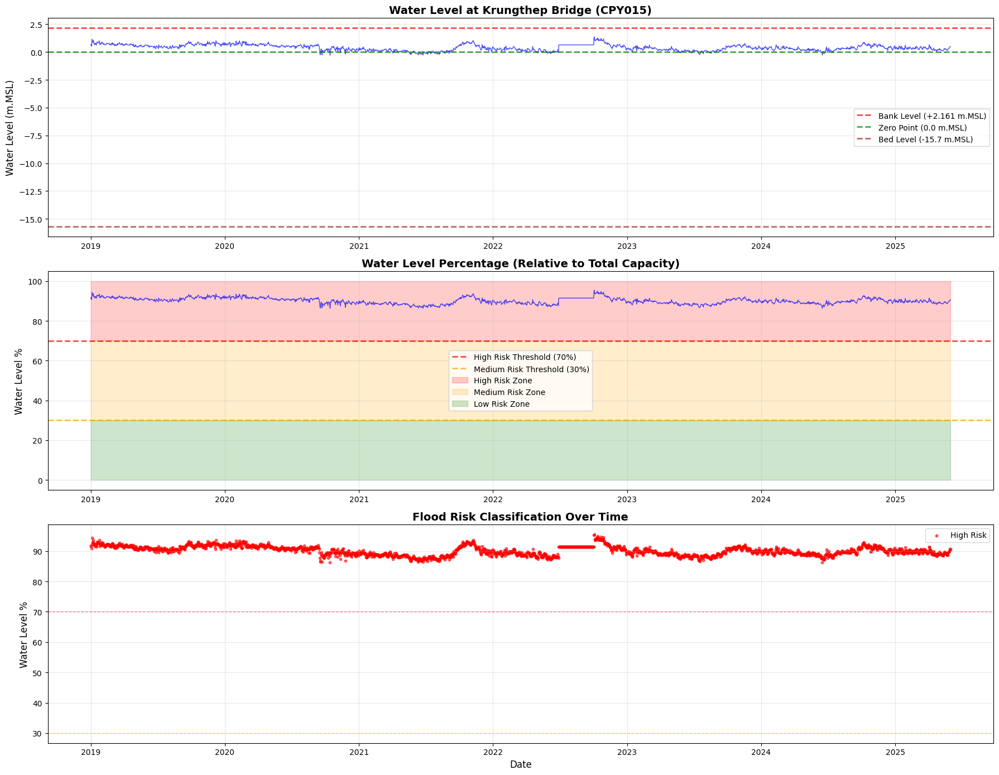

In [44]:
# Visualize Water Level Percentage Over Time
fig, axes = plt.subplots(3, 1, figsize=(18, 14))

# Plot 1: Water Level in m.MSL with reference lines
axes[0].plot(df_daily.index, df_daily['water_level'], linewidth=1, alpha=0.7, color='blue')
axes[0].axhline(y=BANK_LEVEL, color='red', linestyle='--', linewidth=2, label=f'Bank Level (+{BANK_LEVEL} m.MSL)', alpha=0.7)
axes[0].axhline(y=ZERO_POINT, color='green', linestyle='--', linewidth=2, label=f'Zero Point ({ZERO_POINT} m.MSL)', alpha=0.7)
axes[0].axhline(y=BED_LEVEL, color='brown', linestyle='--', linewidth=2, label=f'Bed Level ({BED_LEVEL} m.MSL)', alpha=0.7)
axes[0].set_ylabel('Water Level (m.MSL)', fontsize=12)
axes[0].set_title('Water Level at Krungthep Bridge (CPY015)', fontsize=14, fontweight='bold')
axes[0].legend(loc='best')
axes[0].grid(True, alpha=0.3)

# Plot 2: Water Level Percentage
axes[1].plot(df_daily.index, df_daily['water_level_pct'], linewidth=1, alpha=0.7, color='blue')
axes[1].axhline(y=70, color='red', linestyle='--', linewidth=2, label='High Risk Threshold (70%)', alpha=0.7)
axes[1].axhline(y=30, color='orange', linestyle='--', linewidth=2, label='Medium Risk Threshold (30%)', alpha=0.7)
axes[1].fill_between(df_daily.index, 70, 100, alpha=0.2, color='red', label='High Risk Zone')
axes[1].fill_between(df_daily.index, 30, 70, alpha=0.2, color='orange', label='Medium Risk Zone')
axes[1].fill_between(df_daily.index, 0, 30, alpha=0.2, color='green', label='Low Risk Zone')
axes[1].set_ylabel('Water Level %', fontsize=12)
axes[1].set_title('Water Level Percentage (Relative to Total Capacity)', fontsize=14, fontweight='bold')
axes[1].legend(loc='best')
axes[1].grid(True, alpha=0.3)

# Plot 3: Risk Level Categories Over Time
risk_colors = {'Low Risk': 'green', 'Medium Risk': 'orange', 'High Risk': 'red'}
for risk in ['Low Risk', 'Medium Risk', 'High Risk']:
    risk_data = df_daily[df_daily['risk_level'] == risk]
    if len(risk_data) > 0:
        axes[2].scatter(risk_data.index, risk_data['water_level_pct'], 
                       label=risk, color=risk_colors[risk], alpha=0.6, s=10)

axes[2].axhline(y=70, color='red', linestyle='--', linewidth=1, alpha=0.5)
axes[2].axhline(y=30, color='orange', linestyle='--', linewidth=1, alpha=0.5)
axes[2].set_ylabel('Water Level %', fontsize=12)
axes[2].set_xlabel('Date', fontsize=12)
axes[2].set_title('Flood Risk Classification Over Time', fontsize=14, fontweight='bold')
axes[2].legend(loc='best')
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


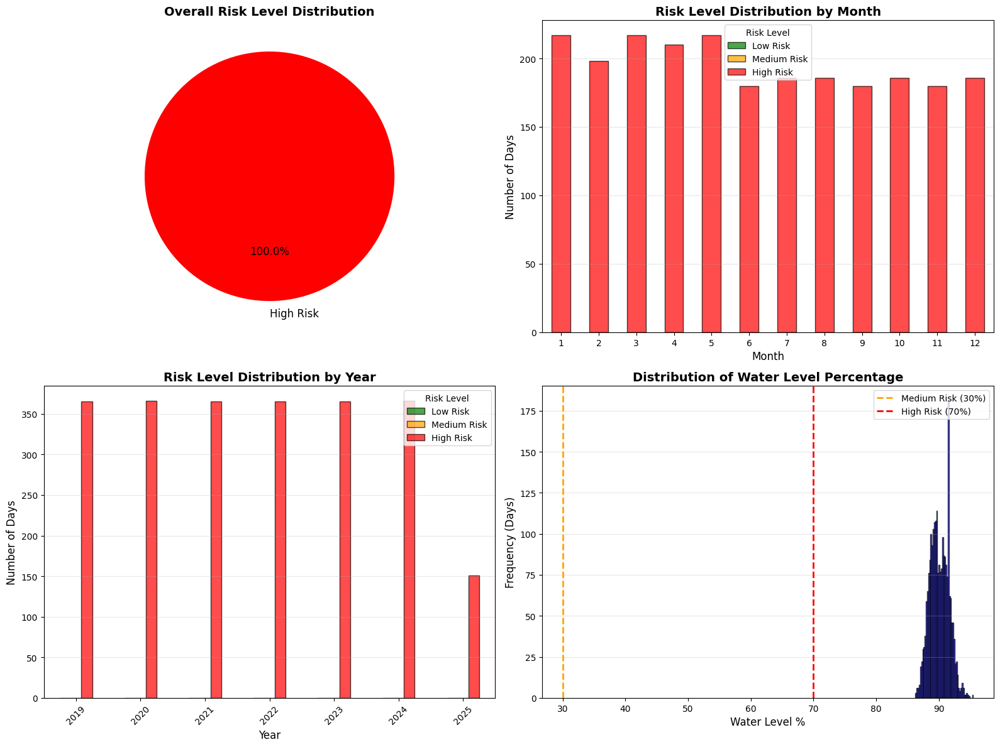

In [45]:
# Detailed Risk Analysis Visualizations
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Plot 1: Risk Level Distribution (Pie Chart)
risk_counts = df_daily['risk_level'].value_counts()
colors_pie = [risk_colors.get(risk, 'gray') for risk in risk_counts.index]
axes[0, 0].pie(risk_counts.values, labels=risk_counts.index, autopct='%1.1f%%',
               colors=colors_pie, startangle=90, textprops={'fontsize': 12})
axes[0, 0].set_title('Overall Risk Level Distribution', fontsize=14, fontweight='bold')

# Plot 2: Risk Level by Month
df_daily['month'] = df_daily.index.month
risk_by_month = pd.crosstab(df_daily['month'], df_daily['risk_level'])
risk_by_month = risk_by_month.reindex(columns=['Low Risk', 'Medium Risk', 'High Risk'], fill_value=0)
risk_by_month.plot(kind='bar', stacked=True, ax=axes[0, 1], 
                   color=['green', 'orange', 'red'], alpha=0.7, edgecolor='black')
axes[0, 1].set_xlabel('Month', fontsize=12)
axes[0, 1].set_ylabel('Number of Days', fontsize=12)
axes[0, 1].set_title('Risk Level Distribution by Month', fontsize=14, fontweight='bold')
axes[0, 1].legend(title='Risk Level')
axes[0, 1].set_xticklabels(axes[0, 1].get_xticklabels(), rotation=0)
axes[0, 1].grid(True, alpha=0.3, axis='y')

# Plot 3: Risk Level by Year
df_daily['year'] = df_daily.index.year
risk_by_year = pd.crosstab(df_daily['year'], df_daily['risk_level'])
risk_by_year = risk_by_year.reindex(columns=['Low Risk', 'Medium Risk', 'High Risk'], fill_value=0)
risk_by_year.plot(kind='bar', stacked=False, ax=axes[1, 0], 
                  color=['green', 'orange', 'red'], alpha=0.7, edgecolor='black')
axes[1, 0].set_xlabel('Year', fontsize=12)
axes[1, 0].set_ylabel('Number of Days', fontsize=12)
axes[1, 0].set_title('Risk Level Distribution by Year', fontsize=14, fontweight='bold')
axes[1, 0].legend(title='Risk Level')
axes[1, 0].set_xticklabels(axes[1, 0].get_xticklabels(), rotation=45)
axes[1, 0].grid(True, alpha=0.3, axis='y')

# Plot 4: Water Level Percentage Distribution
axes[1, 1].hist(df_daily['water_level_pct'], bins=50, edgecolor='black', alpha=0.7, color='blue')
axes[1, 1].axvline(x=30, color='orange', linestyle='--', linewidth=2, label='Medium Risk (30%)')
axes[1, 1].axvline(x=70, color='red', linestyle='--', linewidth=2, label='High Risk (70%)')
axes[1, 1].set_xlabel('Water Level %', fontsize=12)
axes[1, 1].set_ylabel('Frequency (Days)', fontsize=12)
axes[1, 1].set_title('Distribution of Water Level Percentage', fontsize=14, fontweight='bold')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()
